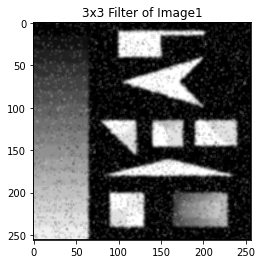

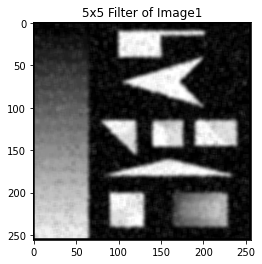

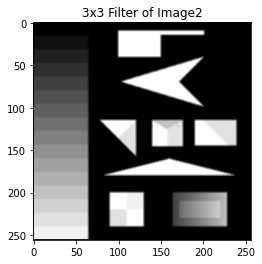

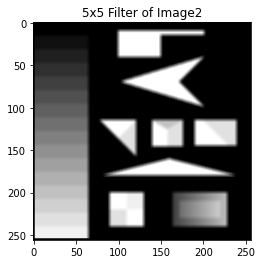

In [1]:
# Name: Sami Eskirjeh
# Course: CAP4453
# Assignment: Robot Vision Program Assignment #1
# Date: 02/13/2021

# Question 1: Box Filtering [1 pt] Implement two box filters (one with 3 by 3, the other one is 5 by 5 kernel size), and apply them to the given images(i.e., image1.png and image2.png) separately. Show the resulting images, and explain the resulting images, and their differences. (For convolution operation, you can use built-in function. Do not use built-in function for box filtering.)

# Solution
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# 3x3 filter function to filter through image and remove pixels
def apply_filter_3x3(img, kernel):
    img_h, img_w = img.shape
    filtered_img = np.zeros((img_h, img_w))
    kernel_radius = int(np.floor(kernel.shape[0] / 2.)) 
    for i in range(kernel_radius, img_w-kernel_radius):
            for j in range(kernel_radius, img_h-kernel_radius):
                filtered_img[j, i] = (kernel * img[j - kernel_radius : j + kernel_radius + 1, i - kernel_radius : i + kernel_radius + 1]).sum()
    return filtered_img

# 5x5 filter function to filter through image and remove pixels 
def apply_filter_5x5(img, kernel):
    img_h, img_w = img.shape
    filtered_img = np.zeros((img_h, img_w))
    kernel_radius = int(np.floor(kernel.shape[0] / 2.)) 
    for i in range(kernel_radius, img_w-kernel_radius):
            for j in range(kernel_radius, img_h-kernel_radius):
                filtered_img[j, i] = (kernel * img[j - kernel_radius : j + kernel_radius + 1, i - kernel_radius : i + kernel_radius + 1]).sum()
    return filtered_img

image1 = cv2.imread('image1.png', 0)
image2 = cv2.imread('image2.png', 0)
# Kernel_# variable for box filtering size
kernel_3 = np.ones((3,3), np.float32) / 9 
kernel_5 = np.ones((5,5), np.float32) / 25 

a3 = apply_filter_3x3(image1, kernel_3)
plt.imshow(a3, cmap="gray"), plt.title('3x3 Filter of Image1')
plt.show()

a5 = apply_filter_5x5(image1, kernel_5)
plt.imshow(a5, cmap="gray"), plt.title('5x5 Filter of Image1')
plt.show()

b3 = apply_filter_3x3(image2, kernel_3)
plt.imshow(b3, cmap="gray"), plt.title('3x3 Filter of Image2')
plt.show()

b5 = apply_filter_5x5(image2, kernel_5)
plt.imshow(b5, cmap="gray"), plt.title('5x5 Filter of Image2')
plt.show()

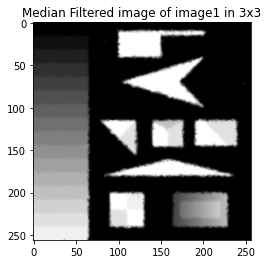

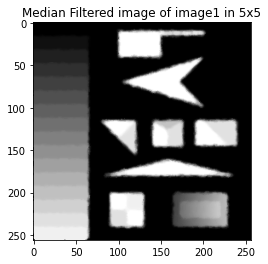

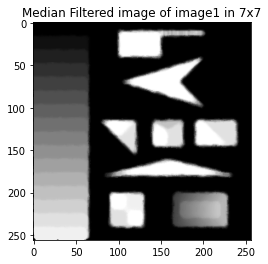

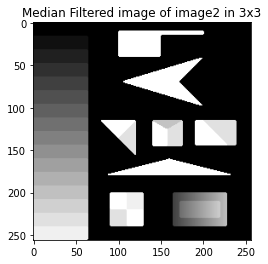

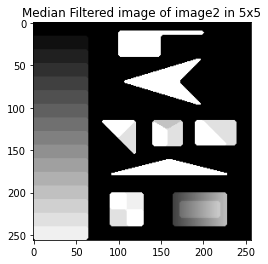

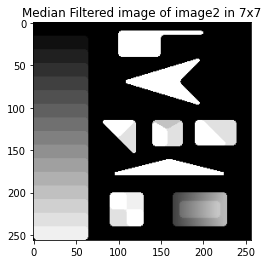

In [2]:
# Question 2: Median Filtering [1 pt] Implement three median filters (3 by 3, 5 by 5, and 7 by 7 kernel size), and apply these filters to image1.png and image2.png separately. Show (and discuss as comments) the resulting differences for each kernel on the screen, explain where median filters are most effective. (For convolution operation, you can use built-in function. Do not use built-in function for Median filtering.)

# Solution:

# Median filtering functions that scans image parameters and kernel where kernel is the fitler_size divided by 2 and parsed through starting index img[0] of j
def medianFiltering(img, kernel):
    temp = []
    filter_size = kernel
    indexer = filter_size // 2
    data_final = []
    data_final = np.zeros((len(img),len(img[0])))
    for i in range(len(img)):
        for j in range(len(img[0])):
            for z in range(filter_size):
                if i + z - indexer < 0 or i + z - indexer > len(img) - 1:
                    for c in range(filter_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(img[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(filter_size):
                            temp.append(img[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
    return data_final

im1 = cv2.imread('image1.png', 0)
im2 = cv2.imread('image2.png', 0)

# Project plots of each image by its respected box dimensions
a3 = medianFiltering(im1, 3)
plt.imshow(a3, cmap="gray"), plt.title('Median Filtered image of image1 in 3x3') 
plt.show()

a5 = medianFiltering(im1, 5)
plt.imshow(a5, cmap="gray"), plt.title('Median Filtered image of image1 in 5x5') 
plt.show()

a7 = medianFiltering(im1, 7)
plt.imshow(a7, cmap="gray"), plt.title('Median Filtered image of image1 in 7x7') 
plt.show()

b3 = medianFiltering(im2, 3)
plt.imshow(b3, cmap="gray"), plt.title('Median Filtered image of image2 in 3x3') 
plt.show()

b5 = medianFiltering(im2, 5)
plt.imshow(b5, cmap="gray"), plt.title('Median Filtered image of image2 in 5x5') 
plt.show()

b7 = medianFiltering(im2, 7)
plt.imshow(b7, cmap="gray"), plt.title('Median Filtered image of image2 in 7x7') 
plt.show()

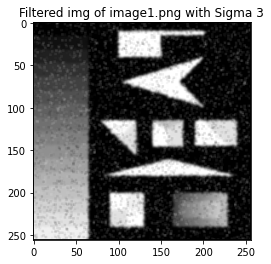

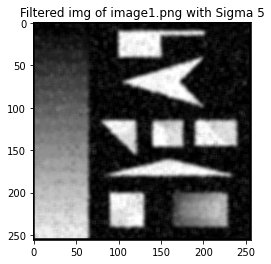

NameError: name 'kernel_7' is not defined

In [13]:
# Question 3: Gaussian Filtering [1 pt] Implement a two-dimensional Gaussian kernel with a variation (sigma) equal to 3, 5, and 10. Apply these three Gaussian kernels to image1.png and image2.png separately, show them on the screen, discuss the differences of Gaussian operations with different sigmas (as comments on the code). Also, compare your results with question1 and question 2: what are the differences between these three filters, what do you observe (as comments on the code) Which filtering is the most effective in which images? Why? (For convolution operation, you can use built-in function. Do not use built-in function for Gaussian filtering.)

#Solution
from math import e
import scipy.stats as st

# Gaus_1D function to convert image of parameter size and sigma to 1D using Gaussian filtering
def Gaus_1D(size, sigma):
  radius = int(np.floor(size / 2))
  mean = 0
  gaus = np.linspace(-radius, radius, size)
  gaus = (1 / (np.sqrt(2 * np.pi) * sigma)) * np.e ** (-np.power((gaus-mean) / sigma, 2) / 2)
  return gaus

# Gaus_2D function to convert image of parameter size and sigma to 2D using Gaussian filtering
def Gaus_2D(size, sigma):
  x = np.reshape(Gaus_1D(size, sigma), (size, 1))
  y = np.dot(x, x.T)
  return y

img1 = cv2.imread('image1.png', 0)
img2 = cv2.imread('image2.png', 0)
kernel_3 = Gaus_2D(3,3)

plt.imshow(apply_filter_3x3(img1, kernel_3), cmap="gray")
plt.title('Filtered img of image1.png with Sigma 3')
plt.show()

plt.imshow(apply_filter_3x3(img1, kernel_5), cmap="gray")
plt.title('Filtered img of image1.png with Sigma 5')
plt.show()

plt.imshow(apply_filter_3x3(img1, kernel_7), cmap="gray")
plt.title('Filtered img of image1.png with Sigma 7')
plt.show()

plt.imshow(apply_filter_3x3(img2, kernel_3), cmap="gray")
plt.title('Filtered img of image2.png with Sigma 3')
plt.show()

plt.imshow(apply_filter_3x3(img2, kernel_5), cmap="gray")
plt.title('Filtered img of image2.png with Sigma 5')
plt.show()

plt.imshow(apply_filter_3x3(img2, kernel_7), cmap="gray")
plt.title('Filtered img of image2.png with Sigma 7')
plt.show()


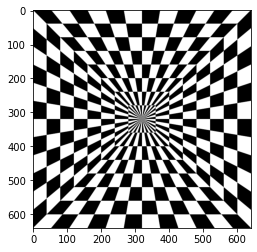

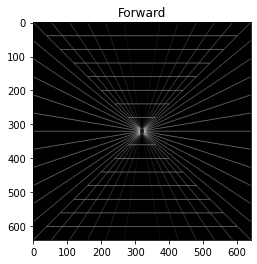

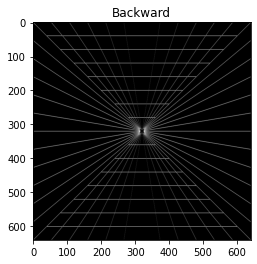

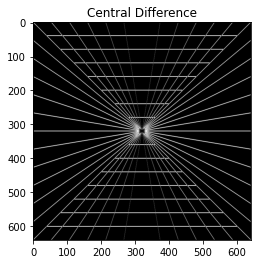

In [14]:
# Question 4: Gradient Operations [1 pt] Write a derivative operations (forward, backward, and central difference) that can be applied to any given image (f) and produces two images: gradient x, and gradient y images (i.e.,fx,fy). Also, calculate gradient magnitude as√(f2x+f2y). The image that you should use for this problem is called image3.png. Show the results on the screen( Do not use built-in gradient functions, create difference operator yourself as stated clearly in the question.)

def Apply_Filter_1D(img, kernel, Odd = 1):
  img_height, img_width = img.shape
  filtered_img = np.zeros((img_height, img_width))
  kernel_radius = int (np.floor(kernel.shape[0] / 2.))
  for row in range(kernel_radius, img_width-kernel_radius):
    for col in range(kernel_radius, img_height-kernel_radius):
      filtered_img[col, row] = (kernel * img[col-kernel_radius : (col+kernel_radius+Odd), row]).sum()
  return filtered_img

k1 = np.array([-1,1])
k2 = np.array([1,-1])
k3 = np.array([-1,0,1])

img3 = cv2.imread('image3.png', 0)
plt.imshow(img3, cmap = "gray")
plt.show()

img3fx = Apply_Filter_1D(img3, k1, Odd = 0)
img3fy = Apply_Filter_1D(img3, k1.T, 0)
m = np.sqrt(img3fx * img3fx + img3fy * img3fy)
max = np.max(m)
m = m / max * 255
m = m.astype(int)

plt.imshow(m, cmap = "gray")
plt.title('Forward')
plt.show()

img3bx = Apply_Filter_1D(img3, k2, Odd = 0)
img3by = Apply_Filter_1D(img3, k2.T, 0)
m = np.sqrt(img3bx * img3bx + img3by * img3by)
max = np.max(m)
m = m / max * 255
m = m.astype(int)

plt.imshow(m, cmap = "gray")
plt.title('Backward')
plt.show()


img3cx = Apply_Filter_1D(img3, k3)
img3cy = Apply_Filter_1D(img3, k3.T)
m = np.sqrt(img3cx * img3cx + img3cy * img3cy)
max = np.max(m)
m = m / max * 255
m = m.astype(int)

plt.imshow(m, cmap = "gray")
plt.title('Central Difference')
plt.show()

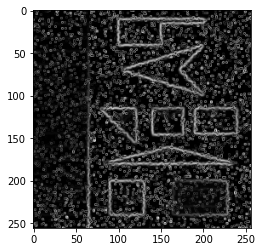

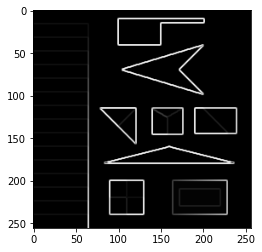

In [18]:
# Question 5: Sobel Filtering [1 pt] Implement Sobel filtering with 3 by 3 kernel size. Apply it to image1.png and image2.png. Show the results on the screen, and discuss the resulting images (as comments on the code). (For convolution operation, you can use built-in function. Do not use built-in function for Sobel filtering.)

from scipy import misc
from matplotlib.pyplot import imread
from scipy import signal

# Sobel_Fitler function that is given pixel array of kh and kv to parse through each derivative of the image and apply filtering at given index pixel
def sobel_filter(image, k_size):
    image = image.astype(np.float)
    width, height= image.shape
    kh = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype = np.float)
    kv = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype = np.float)
    dx = signal.convolve2d(image, kh, mode='same', boundary = 'symm', fillvalue = 0)
    dy = signal.convolve2d(image, kv, mode='same', boundary = 'symm', fillvalue = 0)
    q = np.sqrt(dx * dx + dy * dy)
    q *= 255.0 / np.max(q)
    plt.figure()
    plt.imshow(q, cmap=plt.cm.gray)      
    return q

image1 = cv2.imread('image1.png', 0)
image1_Sobel = sobel_filter(image1, 3)

image2 = cv2.imread('image2.png', 0)
image2_Sobel = sobel_filter(image2, 3)


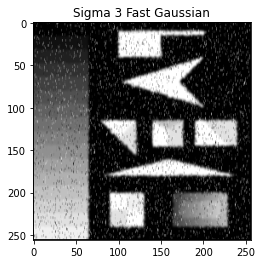

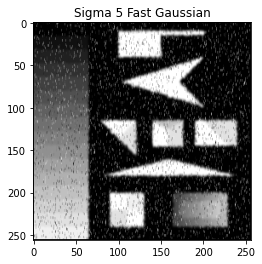

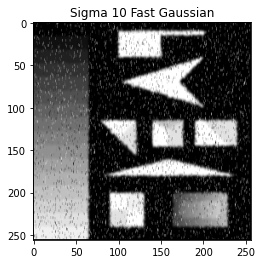

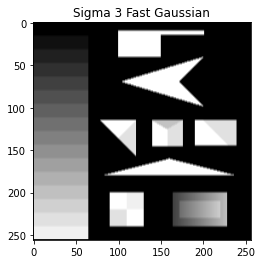

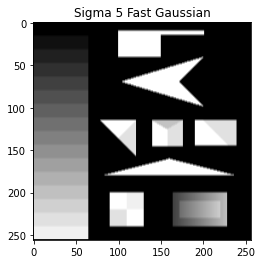

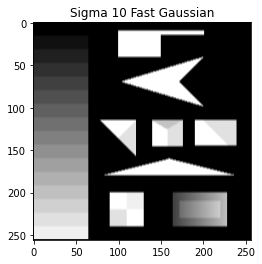

In [19]:
# Question 6: Fast Gaussian Filtering [1 pt] Implement question 3, but this time, use only 1D Gaussian to do filtering in 2D. The trick is the following: sinceGaussians are separable, you can use 1D Gaussian to filter the image in one direction first, and then the otherdirection can be filtered. Show the results on the screen and compare the efficiency of both methods (question 3 and question 6) as comments on the code. Use image1.png and image2.png for smoothing and show results too.(For convolution operation, you can use built-in function. Do not use built-in function for fast Gaussian filtering.)

#Solution
g = Gaus_1D(3,3)
dx = Apply_Filter_1D(img1, g)
dy = Apply_Filter_1D(img1, g.T)
q = np.sqrt(dx * dx + dy * dy)

plt.imshow(q, cmap = "gray")
plt.title('Sigma 3 Fast Gaussian')
plt.show()

g = Gaus_1D(3,5)
dx = Apply_Filter_1D(img1, g)
dy = Apply_Filter_1D(img1, g.T)
q = np.sqrt(dx * dx + dy * dy)
plt.imshow(q, cmap = "gray")
plt.title('Sigma 5 Fast Gaussian')
plt.show()

g = Gaus_1D(3,10)
dx = Apply_Filter_1D(img1, g)
dy = Apply_Filter_1D(img1, g.T)
q = np.sqrt(dx * dx + dy * dy)
plt.imshow(q, cmap = "gray")
plt.title('Sigma 10 Fast Gaussian')
plt.show()

g = Gaus_1D(3,3)
dx = Apply_Filter_1D(img2, g)
dy = Apply_Filter_1D(img2, g.T)
q = np.sqrt(dx * dx + dy * dy)
plt.imshow(q, cmap = "gray")
plt.title('Sigma 3 Fast Gaussian')
plt.show()

g = Gaus_1D(3,5)
dx = Apply_Filter_1D(img2, g)
dy = Apply_Filter_1D(img2, g.T)
q = np.sqrt(dx * dx + dy * dy)
plt.imshow(q, cmap = "gray")
plt.title('Sigma 5 Fast Gaussian')
plt.show()

g = Gaus_1D(3,10)
dx = Apply_Filter_1D(img2, g)
dy = Apply_Filter_1D(img2, g.T)
q = np.sqrt(dx * dx + dy * dy)
plt.imshow(q, cmap = "gray")
plt.title('Sigma 10 Fast Gaussian')
plt.show()

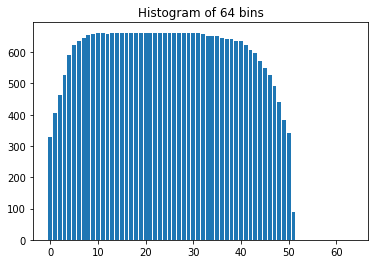

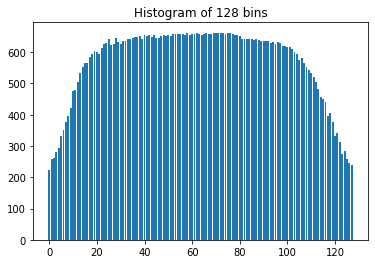

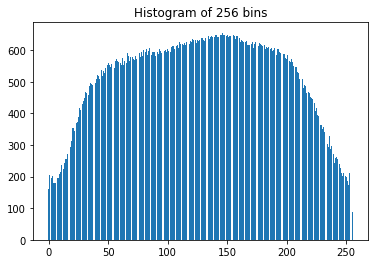

In [20]:
# Question 7: Histogram [2 pt] Implement histogram function from scratch, and show the resulting bar-graph (histogram). Use 256, 128, and 64 bins to visualize histograms. Comment on the resulting differences with respect to bins. Use image4.png to conduct this experiment. (Do not use built-in histogram function, create it yourself.)

# Solution
def plot_hist(matrix, bin, title):
    mat_range = len(matrix)
    bin_size = int((mat_range / bin) / 2)
    bin_count = np.zeros((bin))
    for i in range(mat_range):
        this_bin = matrix[i] // bin_size
        bin_count[this_bin] += 1
    plt.figure()
    plt.bar(np.arange(bin), bin_count), plt.title(title)
    plt.show()

image4 = cv2.imread('image4.png', 0)

t1 = "Histogram of 64 bins"
t2 = "Histogram of 128 bins"
t3 = "Histogram of 256 bins"

a = plot_hist(image4, 64, t1)
b = plot_hist(image4, 128, t2)
c = plot_hist(image4, 256, t3)

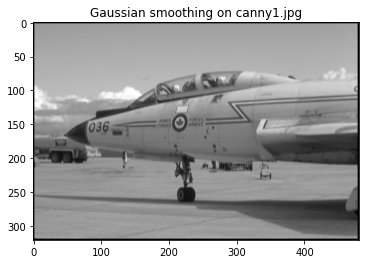

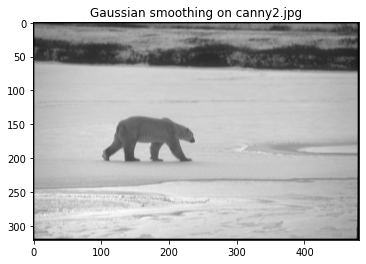

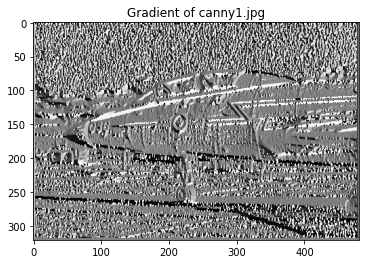

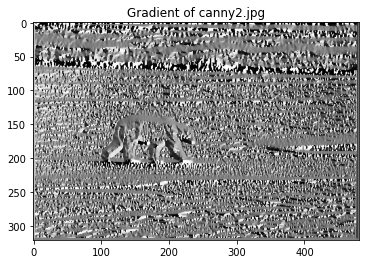

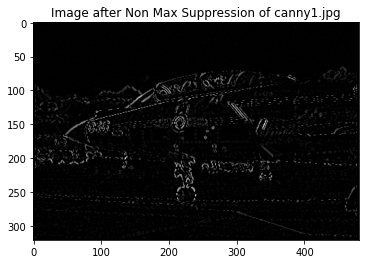

...

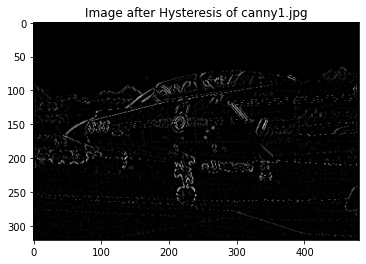

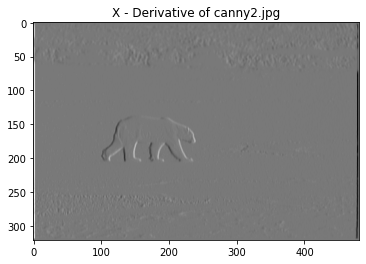

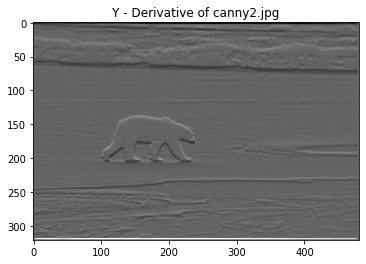

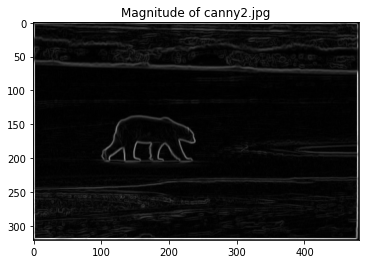

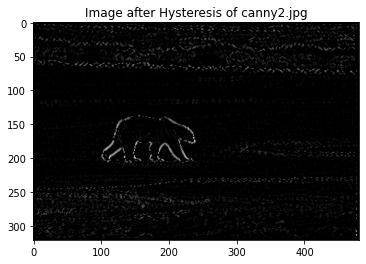

In [21]:
# Question 8: Canny Edge Detection [7 pt]
# Tasks:

# 0 pt Use two different images (canny1.jpg and canny2.jpg) to perform the following steps for getting Canny edgesof the input image.

# 1 pts Use 1-dimensional Gaussians to implement 2D Gaussian filtering yourself (do not use built-in functions).

# 1 pts Obtain gradient images (x-dim, y-dim, gradient magnitude, and gradient orientation) by following the Canny algorithm that we have seen in the class. Show resulting gradient images on screen and in the report.

# 2 pts Implement non-max suppression algorithm to reduce some of the falsely detected edges in the gradient images(from the previous step). Show the improved edge map on the screen and in the report.

# 1 pts Implement hysteresis thresholding algorithm and use it to further enhance the edge map obtained from theprevious step. Show the final Canny edge map on the screen and in the report.

# 1 pts Show the effect of σ in edge detection by choosing three different σ values when smoothing. Note that youneed to indicate which σ works best as a comment in your assignment.

# 1 pts Discuss about the different filtering approaches you took for four pictures. Since pictures are the same scenebut different noise and smoothing patterns, you need to adjust your Canny edge filtering parameters to show similar results to Canny edges of the output-canny1.png and output-canny2.png.

# Solution
# Question 8
import math
c1 = cv2.imread('canny1.jpg', 0)
c2 = cv2.imread('canny2.jpg', 0)

# Smoothen image of canny1.jpg with Apply_Filter function
g = Gaus_1D(5, 1)
dx = Apply_Filter_1D(c1, g)
dy = Apply_Filter_1D(c1, g.T)
q = np.sqrt(dx * dx + dy * dy)

# Smoothen image of canny2.jpg with Apply_Filter function
g2 = Gaus_1D(5, 1)
dx2 = Apply_Filter_1D(c2, g)
dy2 = Apply_Filter_1D(c2, g.T)
q2 = np.sqrt(dx2 * dx2 + dy2 * dy2)

# Project canny1.jpg after soothing
plt.imshow(q, cmap = "gray")
plt.title('Gaussian smoothing on canny1.jpg')
plt.show()

# Project canny2.jpg after soothing
plt.imshow(q2, cmap = "gray")
plt.title('Gaussian smoothing on canny2.jpg')
plt.show()


# Sobel array highlight pixels in given image
kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype = np.float)
ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype = np.float)

# canny1.jpg filter applications for variables
sx = apply_filter_3x3(q, kx)
sy = apply_filter_3x3(q, ky)
s1 = np.sqrt(sx * sx + sy * sy)

s1 = s1 / s1.max() * 255
t = np.arctan2(kx, ky)
t = np.degrees(np.arctan2(sx, sy))
plt.imshow(t, cmap = "gray")
plt.title('Gradient of canny1.jpg')
plt.show()

# canny2.jpg filter applications for given '2' variables
sx2 = apply_filter_3x3(q2, kx)
sy2 = apply_filter_3x3(q2, ky)
s12 = np.sqrt(sx2 * sx2 + sy2 * sy2)

s12 = s12 / s12.max() * 255
t2 = np.arctan2(kx, ky)
t2 = np.degrees(np.arctan2(sx2, sy2))
plt.imshow(t2, cmap = "gray")
plt.title('Gradient of canny2.jpg')
plt.show()

# None_Max to calucalte the angle dimensione of 'm' in img parameter along with angle parameter 't'
def None_Max(img, angle):
  h, w = img.shape
  m = np.zeros((h,w), dtype=np.int32)
  angle[angle < 0] += 180
  x = 3
  for i in range(x, h - x):
    for j in range(x, w - x):
        try:
          q = 255
          r = 255
          #angle 0
          if (0 <= angle[i, j] < 22.5) or (157.5 <= angle[i ,j] <= 180):
            q = img[i, j + x]
            r = img[i, j - x]
          #angle 45
          elif (22.5 <= angle[i,j] < 67.5):
            q = img[i + x, j - x]
            r = img[i - x, j + x]
          #angle 90
          elif (67.5 <= angle[i,j] < 112.5):
            q = img[i + x, j]
            r = img[i - x, j]
          #angle 135
          elif (112.5 <= angle[i,j] < 157.5):
            q = img[i - x, j - x]
            r = img[i + x, j + x]

          if (img[i, j] >= q) and (img[i, j] >= r):
            m[i, j] = img[i, j]
          else:
            m[i, j] = 0
        except IndexError as e:
          pass
  return m

# canny1.jpg intialization
m = None_Max(s1, t)
plt.imshow(m, cmap = "gray")
plt.title('Image after Non Max Suppression of canny1.jpg')
plt.show()

# canny2.jpg intialization
m2 = None_Max(s12, t2)
plt.imshow(m2, cmap = "gray")
plt.title('Image after Non Max Suppression of canny2.jpg')
plt.show()

# ThreshHold function to find ratio of given image and initialize as weak
def ThreshHold(img, Low_Threshold_Ratio = 0.05, High_Threshold_Ratio = 0.09):
    High_Threshold = img.max() * High_Threshold_Ratio
    Low_Threshold = High_Threshold * Low_Threshold_Ratio
    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)
    w = np.int32(25)
    s = np.int32(255)
    s_i, s_j = np.where(img >= High_Threshold)
    z_i, z_j = np.where(img < Low_Threshold)
    w_i, w_j = np.where((img <= High_Threshold) & (img >= Low_Threshold))
    res[s_i, s_j] = s
    res[w_i, w_j] = w
    return (res, w, s)

# hysteresis function to find weak 'w' and strong 's' indexes and initialize in image read array
def hysteresis(img, w, s = 255):
    M, N = img.shape
    for i in range(1, M - 1):
        for j in range(1, N - 1):
            if (img[i, j] == w):
                try:
                    if ((img[i + 1, j - 1] == s) or (img[i + 1, j] == s) or (img[i + 1, j + 1] == s)
                        or (img[i, j - 1] == s) or (img[i, j + 1 ] == s)
                        or (img[i - 1, j - 1] == s) or (img[i - 1, j] == s) or (img[i - 1, j + 1] == s)):
                        img[i, j] = super
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

plt.imshow(sx, cmap = "gray")
plt.title('X - Derivative of canny1.jpg')
plt.show()

plt.imshow(sy, cmap = "gray")
plt.title('Y - Derivative of canny1.jpg')
plt.show()

plt.imshow(s1, cmap = "gray")
plt.title('Magnitude of canny1.jpg')
plt.show()

a, b, c = ThreshHold(m)
m = hysteresis(m, b, c)
m = None_Max(s1, t)
plt.imshow(m, cmap = "gray")
plt.title('Image after Hysteresis of canny1.jpg')
plt.show()

# Mapping of canny2.jpg
plt.imshow(sx2, cmap = "gray")
plt.title('X - Derivative of canny2.jpg')
plt.show()

plt.imshow(sy2, cmap = "gray")
plt.title('Y - Derivative of canny2.jpg')
plt.show()

plt.imshow(s12, cmap = "gray")
plt.title('Magnitude of canny2.jpg')
plt.show()

a2, b2, c2 = ThreshHold(m2)
m2 = hysteresis(m2, b2, c2)
m2 = None_Max(s12, t2)
plt.imshow(m2, cmap = "gray")
plt.title('Image after Hysteresis of canny2.jpg')
plt.show()



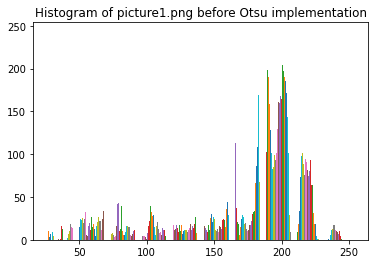

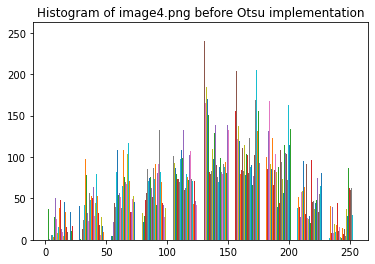

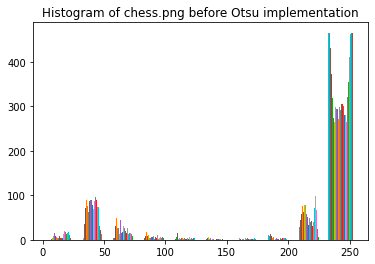

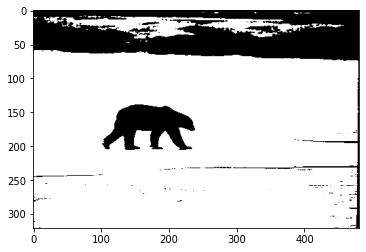

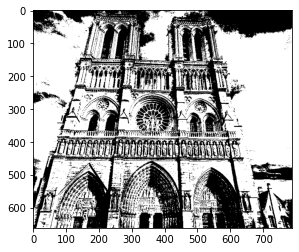

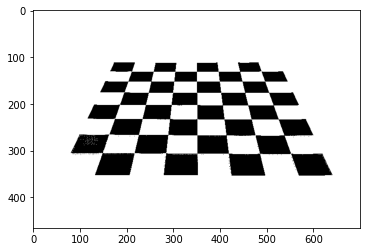

In [23]:
# Question 9: Image segmentation [5 pts]
# In this question you goal is to implement Otsu thresholding to perform image segmentation. The algorithm was discussed during a class lecture.
# Your tasks:
# • First implement a simple thresholding based image binarization algorithm. Plot the histogram for three different input image. Now based on the plot, perform binarization at three different threshold levels.
# • Implement a Otsu thresholding. Use the determined threshold to perform segmentation on the three input image. Note: You are free to choose any 3 images. If the images are colored, you can convert them to greyscale by averaging the RGB values at each pixel. You can also use any library function to convert it to greyscale.

# Solution

# Otsu algorithm displayed as histogram for algorithm to calculate final_thresh and final_value values 
def otsu(img):
    pixels = img.shape[0] * img.shape[1]
    mean_w = 1.0 / pixels
    his, bins = np.histogram(img, np.arange(0, 257))
    final_thresh = -1
    final_value = -1
    intensity = np.arange(256)
    for t in bins[1: -1]: 
        pcb = np.sum(his[:t])
        pcf = np.sum(his[t:])
        Wb = pcb * mean_w
        Wf = pcf * mean_w
        mub = np.sum(intensity[:t] * his[:t]) / float(pcb)
        muf = np.sum(intensity[t:] * his[t:]) / float(pcf)
        value = Wb * Wf * (mub - muf) ** 2
        if value > final_value:
            final_thresh = t
            final_value = value
    final_img = img.copy()
    final_img[img > final_thresh] = 255
    final_img[img < final_thresh] = 0
    return final_img

# Greyscale variable declarations
picture1 = cv2.imread('picture1.png', 0)
image4 = cv2.imread('image4.png', 0) 
chess = cv2.imread('chess.png', 0) 

# Print out histograms of images...This will take a secone to load
plt.hist(picture1)
plt.title("Histogram of picture1.png before Otsu implementation")
plt.show()

plt.hist(image4)
plt.title("Histogram of image4.png before Otsu implementation")
plt.show()

plt.hist(chess)
plt.title("Histogram of chess.png before Otsu implementation")
plt.show()

# Project Otsu implementation of images
otsu_image1 = otsu(picture1)
plt.figure()
plt.imshow(otsu_image1, cmap = "gray")

otsu_image2 = otsu(image4)
plt.figure()
plt.imshow(otsu_image2, cmap = "gray")

otsu_image3 = otsu(chess)
plt.figure()
plt.imshow(otsu_image3, cmap = "gray")
